In [1]:
# ============================================================
# M-GW: Pairwise Alignment of Spatiotemporal Mouse Embryo Slices
# ============================================================

import scanpy as sc
import anndata as ad
import numpy as np, torch, scipy.sparse as sp
from mgw import util, models, plotting, geometry
from mgw import pullback_metric_field, knn_graph
from mgw.gw import solve_gw_ott
import importlib
import matplotlib.pyplot as plt
import os

# ----------------------------
# Runtime & device setup
# ----------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'
torch.set_default_dtype(torch.float64)
print("Device:", device)

# ----------------------------
# Input files & parameters
# ----------------------------
filehandles_embryo_adata = [
    '/scratch/gpfs/ph3641/mouse_embryo/E9.5_E1S1.MOSTA.h5ad',
    '/scratch/gpfs/ph3641/mouse_embryo/E10.5_E1S1.MOSTA.h5ad',
    '/scratch/gpfs/ph3641/mouse_embryo/E11.5_E1S1.MOSTA.h5ad',
    '/scratch/gpfs/ph3641/mouse_embryo/E12.5_E1S1.MOSTA.h5ad',
    '/scratch/gpfs/ph3641/mouse_embryo/E13.5_E1S1.MOSTA.h5ad'
]
timepoints = ['E9.5', 'E10.5', 'E11.5', 'E12.5', 'E13.5']

# Embedding / network parameters
PCA_comp   = 30
knn_k      = 12
geodesic_eps = 0.01

gw_params = dict(verbose=True, inner_maxit=3000, outer_maxit=3000,
                 inner_tol=1e-7, outer_tol=1e-7, epsilon=1e-4)

save_dir = "/scratch/gpfs/ph3641/mgw/ME_Alignments"
os.makedirs(save_dir, exist_ok=True)

# ============================================================
# 1. Load datasets and prepare
# ============================================================
print('Loading AnnData slices...')
adatas = []
for i, fh in enumerate(filehandles_embryo_adata):
    adata = sc.read_h5ad(fh)
    adata.X = adata.layers['count']
    adata.obs['timepoint'] = [timepoints[i]] * adata.shape[0]
    adatas.append(adata)

# Intersect genes across all slices
common_genes = list(set.intersection(*[set(a.var_names) for a in adatas]))
adatas = [a[:, common_genes] for a in adatas]
print(f"Common genes: {len(common_genes)}")


Device: cuda
Loading AnnData slices...
Common genes: 23787


In [2]:
from mgw import metrics
from mgw import mgw as mgw
from scipy.spatial.distance import cdist

# ============================================================
# 2. Loop over consecutive pairs (E11.5→E12.5, E12.5→E13.5)
# ============================================================
importlib.reload(geometry)

N_downsample = 10_000

ad1, ad2 = adatas[0], adatas[1]
tp1, tp2 = timepoints[0], timepoints[1]

print(f"\n--- Aligning {tp1} → {tp2} ---")

# Normalization, log1p, PCA
joint = ad.concat([ad1, ad2], join='inner')

sc.pp.normalize_total(joint)
sc.pp.log1p(joint)
sc.pp.pca(joint, n_comps=PCA_comp)

# Split back into slices
A = joint[joint.obs['timepoint'] == tp1].copy()
B = joint[joint.obs['timepoint'] == tp2].copy()

# ========================================================
# (a) Feature preprocessing (PCA + CCA "feeler")
# ========================================================
pre = mgw.mgw_preprocess(
        A, B,
        PCA_comp=10,
        CCA_comp=10,
        use_cca_feeler=False,
        use_pca_X=True,
        use_pca_Z=True,
        log1p_X=False,
        log1p_Z=False,
        verbose=True,
        feature_only=True,
        spatial_only=False
    )



--- Aligning E9.5 → E10.5 ---


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


[mgw.pre] PCA/raw shapes: X=(5913, 10)  Z=(18408, 10)


In [3]:

# Can use to pick eps for geodesics..
geodesic_eps = 0.00001 

xs, xs2 = pre["xs"], pre["xs2"]
X_rep, Z_rep = pre["X_rep"], pre["Z_rep"]

device="cuda"
widths= (128, 256, 256, 128)
torch.set_default_dtype(torch.float64)
knn_k=12
xs_t, xs2_t = torch.from_numpy(xs).to(device), torch.from_numpy(xs2).to(device)
ys_t, ys2_t = torch.from_numpy(X_rep).to(device), torch.from_numpy(Z_rep).to(device)
dim_e, dim_f_M, dim_f_N = 2, ys_t.shape[1], ys2_t.shape[1]
phi = models.PhiModel(2, dim_f_M, widths=widths).to(device)
psi = models.PhiModel(2, dim_f_N, widths=widths).to(device)

phi = models.train_phi(phi, xs_t,  ys_t,  lr=1e-3, niter=20000, print_every=500, device=device)
psi = models.train_phi(psi, xs2_t, ys2_t, lr=1e-3, niter=20000, print_every=500, device=device)

phi.eval(); psi.eval()
G_M = geometry.pullback_metric_field(phi, torch.from_numpy(xs).to(device), eps=geodesic_eps).cpu()
G_N = geometry.pullback_metric_field(psi, torch.from_numpy(xs2).to(device), eps=geodesic_eps).cpu()

Gs = geometry.knn_graph(xs,  k=knn_k)
Gt = geometry.knn_graph(xs2, k=knn_k)


[train_phi] step=500 loss=0.030246
[train_phi] step=1000 loss=0.022816
[train_phi] step=1500 loss=0.017797
[train_phi] step=2000 loss=0.014735
[train_phi] step=2500 loss=0.013228
[train_phi] step=3000 loss=0.011791
[train_phi] step=3500 loss=0.011546
[train_phi] step=4000 loss=0.010295
[train_phi] step=4500 loss=0.009687
[train_phi] step=5000 loss=0.009049
[train_phi] step=5500 loss=0.008557
[train_phi] step=6000 loss=0.010247
[train_phi] step=6500 loss=0.008037
[train_phi] step=7000 loss=0.007644
[train_phi] step=7500 loss=0.007359
[train_phi] step=8000 loss=0.007219
[train_phi] step=8500 loss=0.007028
[train_phi] step=9000 loss=0.009806
[train_phi] step=9500 loss=0.006609
[train_phi] step=10000 loss=0.006403
[train_phi] step=10500 loss=0.006331
[train_phi] step=11000 loss=0.006173
[train_phi] step=11500 loss=0.006068
[train_phi] step=12000 loss=0.005985
[train_phi] step=12500 loss=0.005720
[train_phi] step=13000 loss=0.005836
[train_phi] step=13500 loss=0.005573
[train_phi] step=1400

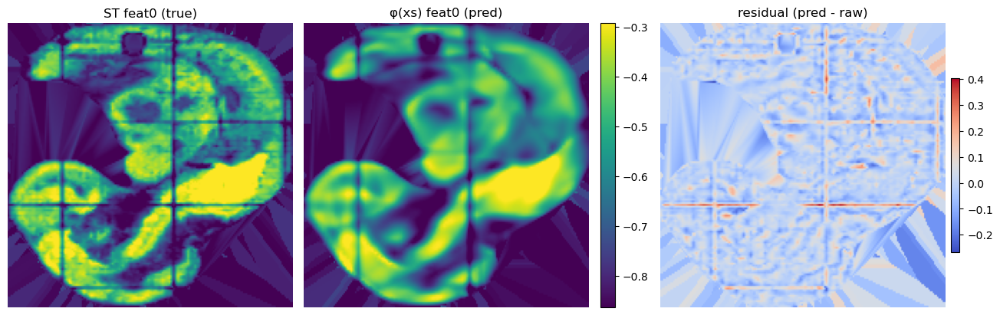

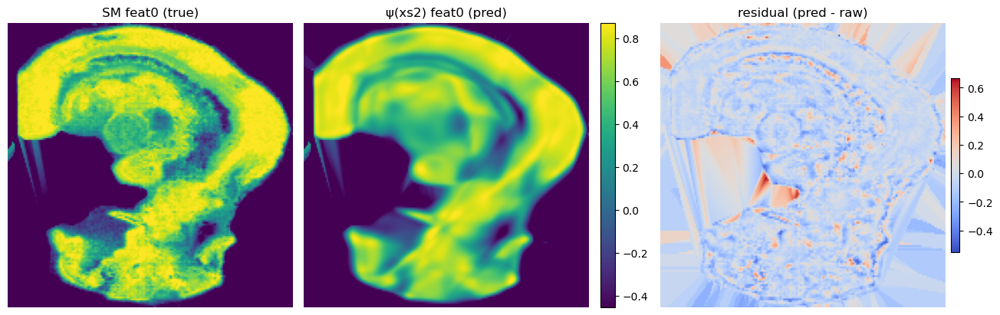

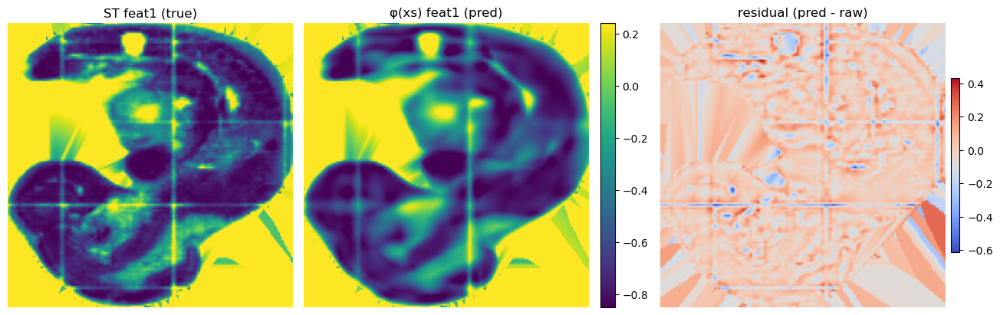

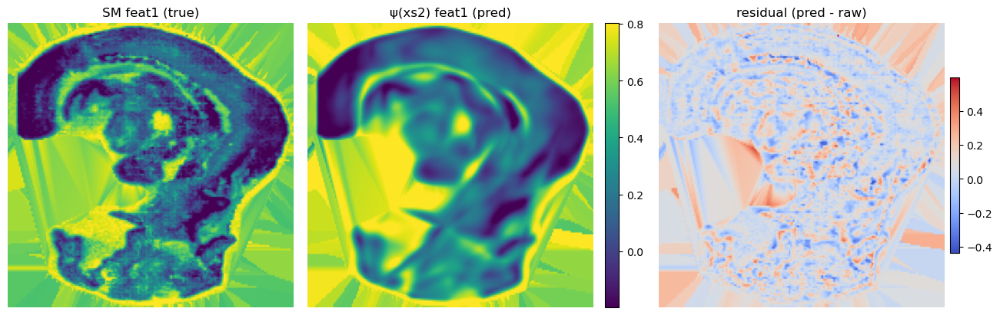

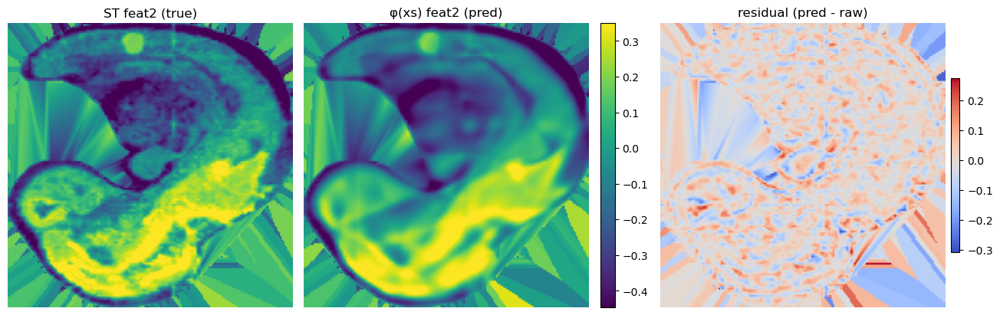

...

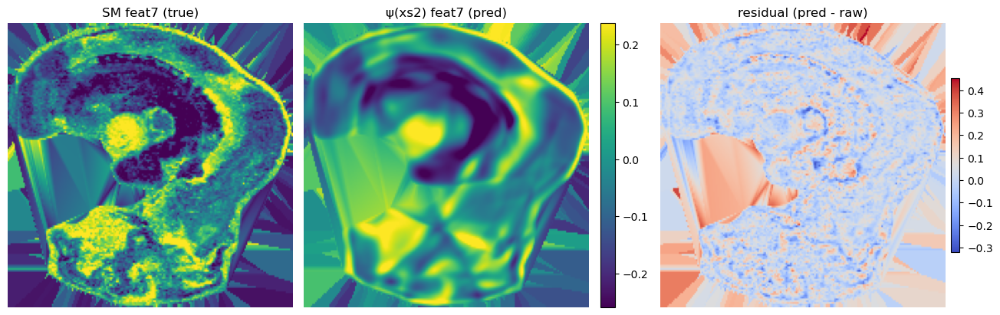

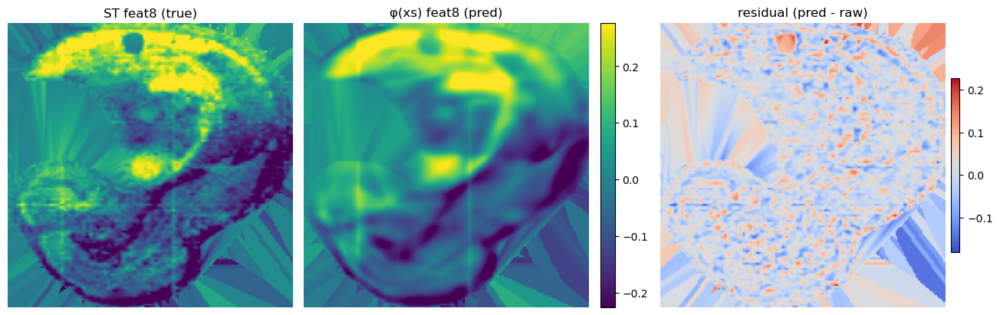

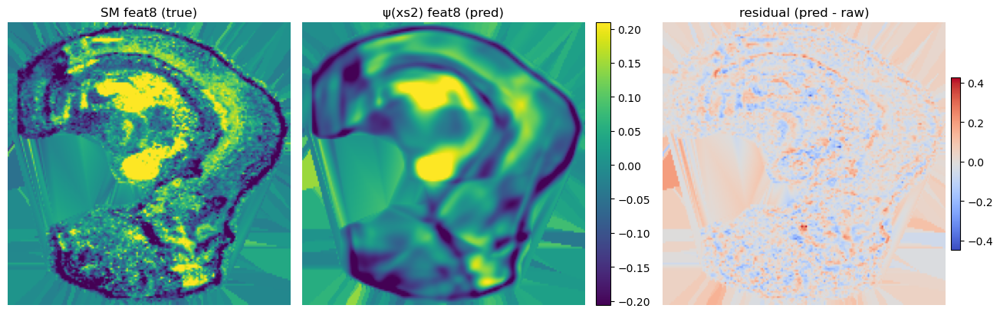

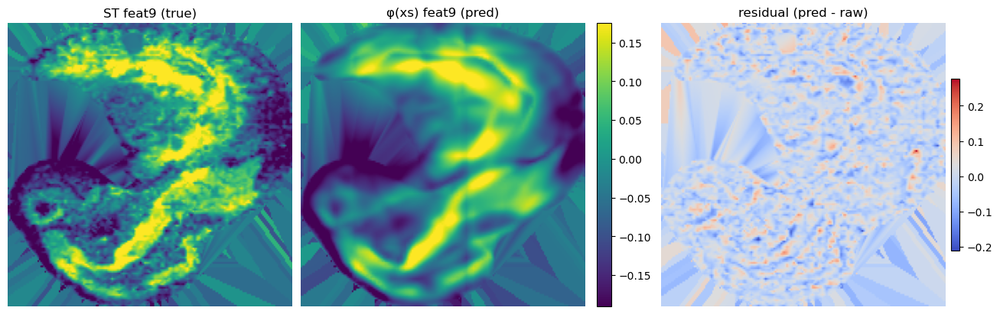

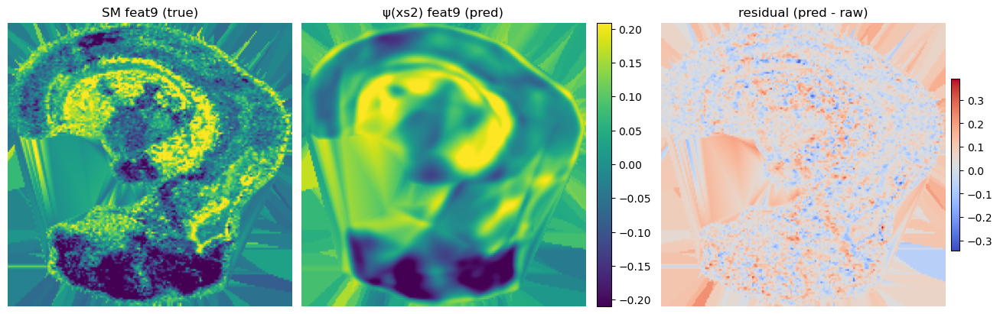

In [4]:

for k in range(10):
    X_pred = plotting.predict_on_model(phi, xs)
    plotting.plot_fit_on_cloud(xs, ys_t[:,k].cpu().numpy(), X_pred[:,k],
                               title_true=f'ST feat{k} (true)', title_pred=f'φ(xs) feat{k} (pred)')
    Z_pred = plotting.predict_on_model(psi, xs2)
    plotting.plot_fit_on_cloud(xs2, ys2_t[:,k].cpu().numpy(), Z_pred[:,k],
                               title_true=f'SM feat{k} (true)', title_pred=f'ψ(xs2) feat{k} (pred)')

In [5]:
W_M = plotting.build_weighted_graph(xs, G_M, Gs)         # build once
W_N = plotting.build_weighted_graph(xs2, G_N, Gt)         # build once

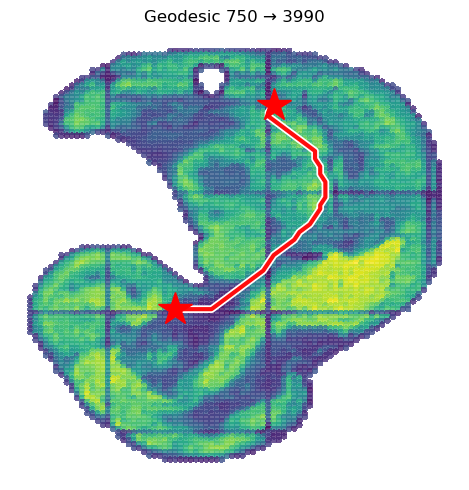

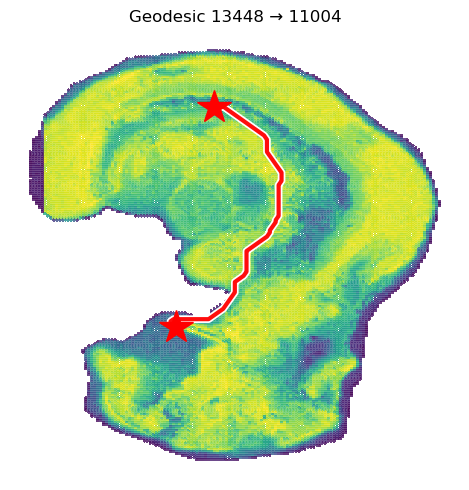

In [8]:
importlib.reload(plotting)

k=0

i, j = 750, 3990

_, pred = plotting.geodesics_from_source(W_M, i)
path, ok = plotting.traceback_path(pred, i, j)
color = ys_t.detach()[:, k].cpu().numpy()
plotting.plot_geodesic(xs, path, color=color, title=f'Geodesic {i} → {j}', max_points=50_000, s=60)

i, j = 13448, 11004

_, pred = plotting.geodesics_from_source(W_N, i)
path, ok = plotting.traceback_path(pred, i, j)
color = ys2_t.detach()[:, k].cpu().numpy()
plotting.plot_geodesic(xs2, path, color=color, title=f'Geodesic {i} → {j}', max_points=50_000)
